# Importaciones

In [2]:
from zipfile import ZipFile
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import mne
import seaborn as sns
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, recall_score, f1_score, roc_curve, auc, roc_auc_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, Flatten, Input, BatchNormalization
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Descarga de datos

Los link de descarga son los siguientes: ("https://zenodo.org/record/1252141/files/EEGs_Guinea-Bissau.zip", "EEGs_Guinea-Bissau.zip"),
    ("https://zenodo.org/record/1252141/files/EEGs_Nigeria.zip", "EEGs_Nigeria.zip")

# Descomprimir, Leer, Convetir a MNE y Categorizar los datos

In [3]:
meta_df2 = pd.read_csv('https://zenodo.org/record/1252141/files/metadata_nigeria.csv')
meta_df2.head(15)

,subject.id,recordedPeriod,startTime,session.id,first_condition,remarks,Group,csv.file
0,6,270,26/9/2016 13:13,1,open,NaN,control,signal-6-1.csv.gz
1,9,271,26/9/2016 13:30,1,closed,NaN,control,signal-9-1.csv.gz
2,10,272,26/9/2016 13:36,1,open,eyes closed at 2:40,control,signal-10-1.csv.gz
3,11,274,26/9/2016 13:42,2,closed,no.11.1 failed >> 11.2 is the right one,control,signal-11-2.csv.gz
4,11,1,26/9/2016 13:42,1,closed,no.11.1 failed >> 11.2 is the right one,control,signal-11-1.csv.gz
5,12,271,26/9/2016 13:47,1,open,NaN,control,signal-12-1.csv.gz
6,40,271,26/9/2016 16:56,1,open,eyes closed at 2:40,control,signal-40-1.csv.gz
7,49,268,27/9/2016 14:29,1,closed,Teacher + not deaf but sign language experienc...,control,signal-49-1.csv.gz
8,63,268,30/9/2016 9:45,1,open,Oxipitaal slecht contact eerste 2:19 minuten,control,signal-63-1.csv.gz
9,64,271,30/9/2016 9:51,1,closed,NaN,control,signal-64-1.csv.gz


In [4]:
#now i need to seprate Epilepsy vs Control subjects
EP_sub2=meta_df2['subject.id'][meta_df2['Group']=='epilepsy']
CT_sub2=meta_df2['subject.id'][meta_df2['Group']=='control']

In [5]:
Epilepsy2 = []
for i in meta_df2.index[meta_df2['subject.id'].isin(EP_sub2)]:
    try:
        df = pd.read_csv(f'EEGs_Nigeria/{meta_df2["csv.file"].iloc[i]}', compression='gzip')
        Epilepsy2.append(df)
    except FileNotFoundError:
        print(f"Archivo no encontrado: {meta_df2['csv.file'].iloc[i]} - Se omitirá.")

# Leer archivos CSV para sujetos de Control
Control2 = []
for i in meta_df2.index[meta_df2['subject.id'].isin(CT_sub2)]:
    try:
        df = pd.read_csv(f'EEGs_Nigeria/{meta_df2["csv.file"].iloc[i]}', compression='gzip')
        Control2.append(df)
    except FileNotFoundError:
        print(f"Archivo no encontrado: {meta_df2['csv.file'].iloc[i]} - Se omitirá.")


Archivo no encontrado: signal-11-1.csv.gz - Se omitirá.
Archivo no encontrado: signal-65-2.csv.gz - Se omitirá.
Archivo no encontrado: signal-65-1.csv.gz - Se omitirá.
Archivo no encontrado: signal-69-1.csv.gz - Se omitirá.


In [6]:
Epilepsy2[0].head()

,Unnamed: 0,AF3,AF4,F3,F4,F7,F8,FC5,FC6,O1,...,CQ_F3,CQ_P7,CQ_P8,CQ_F4,CQ_AF3,CQ_FC5,CQ_O1,CQ_T8,CQ_F8,CQ_DRL
0,1,4036,330.221053,4134,-213.473684,155.242105,3712,322.421053,3935,4169,...,4,4,4,4,4,4,4,4,4,4
1,2,4053,341.505263,4138,-211.936842,160.368421,3715,321.905263,3944,4173,...,4,4,4,4,4,4,4,4,4,4
2,3,4053,-344.757895,4137,-212.957895,156.778947,3713,322.421053,3939,4174,...,4,4,4,4,4,4,4,4,4,4
3,4,4044,343.557895,4136,-212.452632,147.042105,3713,323.452632,3930,4170,...,4,4,4,4,4,4,4,4,4,4
4,5,4049,-344.242105,4131,-213.989474,141.400000,3712,319.347368,3927,4170,...,4,4,4,4,4,4,4,4,4,4


In [7]:
#remove non eeg channels
Epilepsy2=[i.iloc[:,1:15] for i in  Epilepsy2]
Control2=[i.iloc[:,1:15] for i in  Control2]

In [8]:
def convertDF2MNE(sub):
    info = mne.create_info(list(sub.columns), ch_types=['eeg'] * len(sub.columns), sfreq=128)
    info.set_montage('standard_1020')
    data=mne.io.RawArray(sub.T, info)
    data.set_eeg_reference()
    data.filter(l_freq=0.1,h_freq=45)
    epochs=mne.make_fixed_length_epochs(data,duration=5,overlap=1)
    epochs=epochs.drop_bad()

    return epochs

In [9]:
%%capture
#Convert each dataframe to mne object
Epilepsy2=[convertDF2MNE(i) for i in  Epilepsy2]
Control2=[convertDF2MNE(i) for i in  Control2]

#concatenate the epochs
Epilepsy_epochs2=mne.concatenate_epochs(Epilepsy2)
Control_epochs2=mne.concatenate_epochs(Control2)

In [10]:
Epilepsy_group2=np.concatenate([[i]*len(Epilepsy2[i]) for i in range(len(Epilepsy2))])#create a list of list where each sub list corresponds to subject_no
Control_group2=np.concatenate([[i]*len(Control2[i]) for i in range(len(Control2))])#create a list of list where each sub list corresponds to subject_no

Epilepsy_label2=np.concatenate([[0]*len(Epilepsy2[i]) for i in range(len(Epilepsy2))])
Control_label2=np.concatenate([[1]*len(Control2[i]) for i in range(len(Control2))])

In [11]:
#combine data
data2=mne.concatenate_epochs([Epilepsy_epochs2,Control_epochs2])
group2=np.concatenate((Epilepsy_group2,Control_group2))
label2=np.concatenate((Epilepsy_label2,Control_label2))
print(len(data2),len(group2),len(label2))

Not setting metadata
14158 matching events found
No baseline correction applied
14158 14158 14158


# Análisis exploratorio de datos (EDA)

In [12]:
n_epochs = len(data2)
n_channels = data2.info['nchan']
n_time_points = data2.get_data(copy=False).shape[2]

# Calculate and display summary statistics for EEG data
eeg_data = data2.get_data(copy=False)  # Get the EEG data
mean_data = np.mean(eeg_data, axis=(0, 2))  # Calculate the mean across epochs and time points
std_data = np.std(eeg_data, axis=(0, 2))    # Calculate the standard deviation

In [13]:
print("Number of Epochs:", n_epochs)
print("Number of Channels:", n_channels)
print("Number of Time Points:", n_time_points)
print("Mean EEG Data:", mean_data)
print("Standard Deviation of EEG Data:", std_data)

Number of Epochs: 14158
Number of Channels: 14
Number of Time Points: 640
Mean EEG Data: [-0.14268089 -0.22902744 -0.20695868 -0.02025755  0.12887192  0.47633309
  0.0716643   0.34118025 -0.46375583  0.01288911 -0.01724182  0.00812218
  0.06556443 -0.02470306]
Standard Deviation of EEG Data: [113.41952541 174.83198585  83.06877457 165.78479813  83.48935427
 127.32786879 152.14039973 110.52112398  87.66898961  81.26634349
  70.52193103 113.2247322   71.04610261 106.94576022]


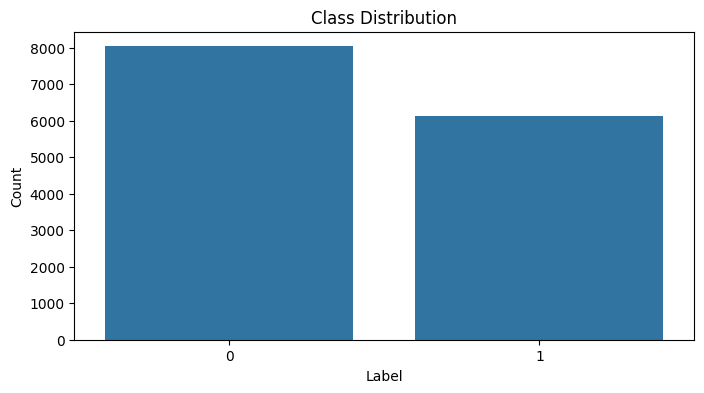

In [14]:
plt.figure(figsize=(8, 4))
sns.countplot(x=label2)
plt.xlabel('Label')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.show()

The subject at index 0 belongs to the 'Epilepsy' group.
Using data from preloaded Raw for 66 events and 640 original time points ...


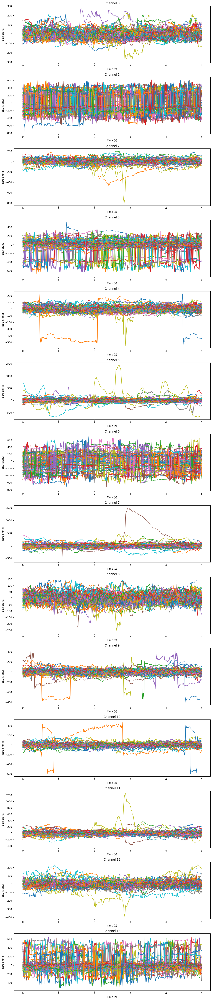

In [15]:
subject_index = 0  # Choose the subject index (0 for the first subject)

# Check if the subject is from the Epilepsy group or the Control group
if subject_index < len(EP_sub2):
    subject_group = 'Epilepsy'
else:
    subject_group = 'Control'

print(f"The subject at index {subject_index} belongs to the '{subject_group}' group.")

# Get the epochs data for the chosen subject
subject_epochs = Epilepsy2[subject_index] if subject_index < len(Epilepsy2) else Control2[subject_index - len(Epilepsy2)]

# Get the EEG data for this subject's epochs
subject_data = subject_epochs.get_data()
n_channels = subject_data.shape[1]

# Create a time vector based on the number of time points
n_time_points = subject_data.shape[2]
time_vector = np.arange(n_time_points) / subject_epochs.info['sfreq']

# Create a figure with subplots for each channel in a single column
fig, axes = plt.subplots(n_channels, 1, figsize=(12, 4 * n_channels))

# Loop through the channels and plot the EEG signals for the chosen subject
for channel_idx in range(n_channels):
    eeg_data = subject_data[:, channel_idx, :]

    axes[channel_idx].plot(time_vector, eeg_data.T)
    axes[channel_idx].set_xlabel('Time (s)')
    axes[channel_idx].set_ylabel('EEG Signal')
    axes[channel_idx].set_title(f'Channel {channel_idx}')

plt.tight_layout()
plt.show()


Using data from preloaded Raw for 66 events and 640 original time points ...


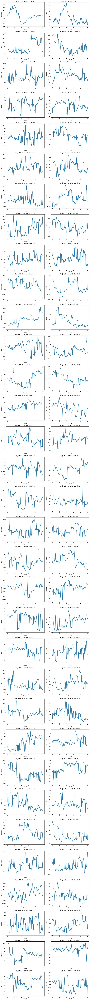

In [16]:
subject_index = 0
channel_of_interest = 0

# Get the epochs data for the chosen subject
subject_epochs = Epilepsy2[subject_index] if subject_index < len(Epilepsy2) else Control[subject_index - len(Epilepsy2)]

# Get the EEG data for this subject's epochs and the specified channel
subject_data = subject_epochs.get_data()[:, channel_of_interest, :]
n_epochs = subject_data.shape[0]

# Create a time vector based on the number of time points
n_time_points = subject_data.shape[1]
time_vector = np.arange(n_time_points) / subject_epochs.info['sfreq']

# Set up the figure and subplot layout
num_rows = (n_epochs + 1) // 2
fig, axes = plt.subplots(num_rows, 2, figsize=(12, 4 * num_rows))

for epoch_idx in range(n_epochs):
    row = epoch_idx // 2
    col = epoch_idx % 2

    epoch_signal = subject_data[epoch_idx, :]

    axes[row, col].plot(time_vector, epoch_signal)
    axes[row, col].set_xlabel('Time (s)')
    axes[row, col].set_ylabel('EEG Signal')
    axes[row, col].set_title(f'Subject {subject_index}, Channel {channel_of_interest} - Epoch {epoch_idx}')

if n_epochs % 2 != 0:
    axes[num_rows - 1, 1].axis('off')

plt.tight_layout()
plt.show()


# Extraer características de potencia del espectro de señales

1. Define las bandas de frecuencia específicas que se utilizarán para la extracción de características. Estas bandas incluyen delta, theta, alpha, sigma, beta y gamma.
2. Utiliza la función psd_welch de la biblioteca MNE (Python para Neurociencia) para calcular la PSD de la señal EEG utilizando el método de Welch. Esta función calcula la densidad espectral de potencia utilizando la técnica de ventanas superpuestas y promedio.
3. Normaliza las PSDs dividiéndolas por la suma de las PSDs a lo largo del último eje (para cada epoca) para obtener medidas de potencia relativa.
4. Itera sobre las bandas de frecuencia definidas, calcula la PSD promedio en cada banda y las almacena en una lista.
5. Concatena las PSDs promedio de cada banda en un solo vector de características, que se devuelve como salida.

In [17]:
def eeg_power_band(epochs):
    # Define las bandas de frecuencia específicas
    FREQ_BANDS = {"delta": [0.5, 4.5],
                  "theta": [4.5, 8.5],
                  "alpha": [8.5, 11.5],
                  "sigma": [11.5, 15.5],
                  "beta": [15.5, 30],
                  "gamma": [30, 45]}

    # Compute la PSD usando el método de Welch
    psds, freqs = mne.time_frequency.psd_array_welch(epochs.get_data(copy=False), sfreq=epochs.info['sfreq'], fmin=0.5, fmax=45, n_fft=256, n_overlap=128,window='hamming')

    # Normaliza las PSDs
    psds /= np.sum(psds, axis=-1, keepdims=True)

    X = []
    # Para cada banda de frecuencia, calcula la media de la PSD en esa banda
    for fmin, fmax in FREQ_BANDS.values():
        psds_band = psds[:, :, (freqs >= fmin) & (freqs < fmax)].mean(axis=-1)
        X.append(psds_band)

    return np.concatenate(X, axis=1)


In [18]:
features2=[]
for d in range(len(data2)):#get features from each epoch and save in a list
    print(d)
    features2.append(eeg_power_band(data2[d]))

0
Effective window size : 2.000 (s)
1
Effective window size : 2.000 (s)
2
Effective window size : 2.000 (s)
3
Effective window size : 2.000 (s)
4
Effective window size : 2.000 (s)
5
Effective window size : 2.000 (s)
6
Effective window size : 2.000 (s)
7
Effective window size : 2.000 (s)
8
Effective window size : 2.000 (s)
9
Effective window size : 2.000 (s)
10
Effective window size : 2.000 (s)
11
Effective window size : 2.000 (s)
12
Effective window size : 2.000 (s)
13
Effective window size : 2.000 (s)
14
Effective window size : 2.000 (s)
15
Effective window size : 2.000 (s)
16
Effective window size : 2.000 (s)
17
Effective window size : 2.000 (s)
18
Effective window size : 2.000 (s)
19
Effective window size : 2.000 (s)
20
Effective window size : 2.000 (s)
21
Effective window size : 2.000 (s)
22
Effective window size : 2.000 (s)
23
Effective window size : 2.000 (s)
24
Effective window size : 2.000 (s)
25
Effective window size : 2.000 (s)
26
Effective window size : 2.000 (s)
27
Effectiv

In [19]:
features2=np.concatenate(features2)

# Implementación de modelos

In [38]:
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features2)
labels_encoded = to_categorical(label2)

In [39]:
best_f1 = 0
best_accuracy1 = 0
best_recall1 = 0
best_model = None

accuracies = []
recalls = []
f1_scores = []

skf = StratifiedKFold(n_splits=5)

for train_index, test_index in skf.split(features_scaled, label2):
    # Dividir los datos en entrenamiento y prueba para cada fold
    X_train, X_test = features_scaled[train_index], features_scaled[test_index]
    y_train, y_test = label2[train_index], label2[test_index]

    # Codificar las etiquetas en formato one-hot
    y_train_encoded = to_categorical(y_train)
    y_test_encoded = to_categorical(y_test)

    # Definir el modelo de red neuronal
    model = Sequential([
        Input(shape=(X_train.shape[1],)),
        Dense(128, activation='relu'),
        Dropout(0.3),
        Dense(128, activation='relu'),
        Dropout(0.3),
        Dense(32, activation='relu'),
        Dense(2, activation='sigmoid')
    ])

    # Compilar el modelo
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', 'Recall'])

    # Entrenar el modelo
    model.fit(X_train, y_train_encoded, epochs=50, batch_size=32, verbose=0)

    # Evaluar el modelo en el conjunto de prueba
    _, accuracy, recall = model.evaluate(X_test, y_test_encoded, verbose=0)
    accuracies.append(accuracy)
    recalls.append(recall)

    # Calcular el F1 Score usando predicciones
    y_pred = model.predict(X_test)
    y_pred_binary = (y_pred > 0.5).astype(int)  # Convertir probabilidades a etiquetas binarias
    f1 = f1_score(y_test, y_pred_binary[:, 1])  # Comparar con la clase positiva (índice 1)
    f1_scores.append(f1)

    # Almacenar el mejor modelo según F1 Score
    if f1 > best_f1:
        best_f1 = f1
        best_accuracy1 = accuracy
        best_recall1 = recall
        best_model = model

# Guardar el mejor modelo
if best_model:
    best_model.save('models/modelo_inicial_n.keras')

# Imprimir resultados
print(f"Mejor precisión: {best_accuracy1}, Mejor recall: {best_recall1}, Mejor F1 Score: {best_f1}")
print(f"Promedio F1 Score: {np.mean(f1_scores)}")

89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Mejor precisión: 0.75, Mejor recall: 0.7510592937469482, Mejor F1 Score: 0.6854082998661312
Promedio F1 Score: 0.6062590704323315


443/443 ━━━━━━━━━━━━━━━━━━━━ 0s 962us/step


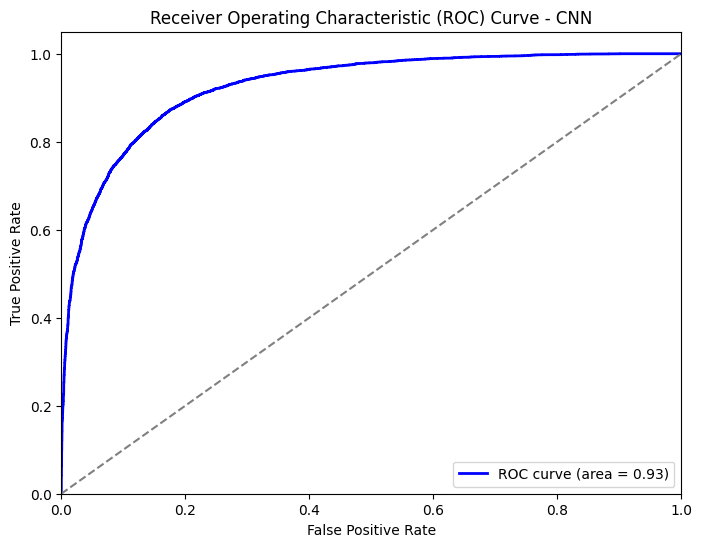

AUC del mejor modelo CNN: 0.9259


In [40]:
roc_curves = []
best_model_pred_probs = best_model.predict(features_scaled)

# Obtener etiquetas reales en formato binario
label2_binary = to_categorical(label2)

# Calcular la curva ROC
fpr, tpr, _ = roc_curve(label2_binary[:, 1], best_model_pred_probs[:, 1])
roc_auc = auc(fpr, tpr)
roc_curves.append({'model': 'CNN', 'fpr': fpr, 'tpr': tpr, 'auc': roc_auc})

# Graficar la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Línea base
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - CNN')
plt.legend(loc='lower right')
plt.show()

# Imprimir el AUC
print(f'AUC del mejor modelo CNN: {roc_auc:.4f}')

In [50]:
best_accuracy2 = 0
best_recall2 = 0
best_f1_2 = 0
best_model = None
best_train_indices = None
best_test_indices = None

accuracies2 = []
recalls2 = []
f1_scores2 = []

skf = StratifiedKFold(n_splits=5)

for train_index, test_index in skf.split(features_scaled, label2):
    # Dividir los datos
    X_train, X_test = features_scaled[train_index], features_scaled[test_index]
    y_train, y_test = labels_encoded[train_index], labels_encoded[test_index]

    # Reshape para LSTM
    X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

    # Modelo LSTM
    model2 = Sequential([
        Input(shape=(X_train.shape[1], X_train.shape[2])),
        LSTM(50),
        Dropout(0.5),
        Dense(50, activation='relu'),
        Dropout(0.5),
        Dense(64, activation='relu'),
        Dense(labels_encoded.shape[1], activation='sigmoid')
    ])
    model2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', 'Recall'])

    # Entrenamiento
    model2.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)

    # Evaluación
    _, accuracy, recall = model2.evaluate(X_test, y_test, verbose=0)
    accuracies2.append(accuracy)
    recalls2.append(recall)

    # Calcular el F1 Score
    y_pred = model2.predict(X_test)
    y_pred_binary = (y_pred > 0.5).astype(int)  # Convertir probabilidades a etiquetas binarias
    f1 = f1_score(y_test.argmax(axis=1), y_pred_binary.argmax(axis=1))  # Usar índices de clases
    f1_scores2.append(f1)

    # Almacenar el modelo si tiene el mejor F1 Score
    if f1 > best_f1_2:
        best_f1_2 = f1
        best_accuracy2 = accuracy
        best_recall2 = recall
        best_model = model2
        best_train_indices = train_index
        best_test_indices = test_index

# Guardar el mejor modelo
if best_model:
    best_model.save('models/modelo_RNN_n.keras')

# Imprimir resultados
print(f"Mejor precisión: {best_accuracy2}, Mejor recall: {best_recall2}, Mejor F1 Score: {best_f1_2}")
print(f"Promedio F1 Score: {np.mean(f1_scores2)}")

89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
89/89 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
89/89 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step
89/89 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
Mejor precisión: 0.7224576473236084, Mejor recall: 0.7245762944221497, Mejor F1 Score: 0.6703020134228188
Promedio F1 Score: 0.5926900412317977


443/443 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step


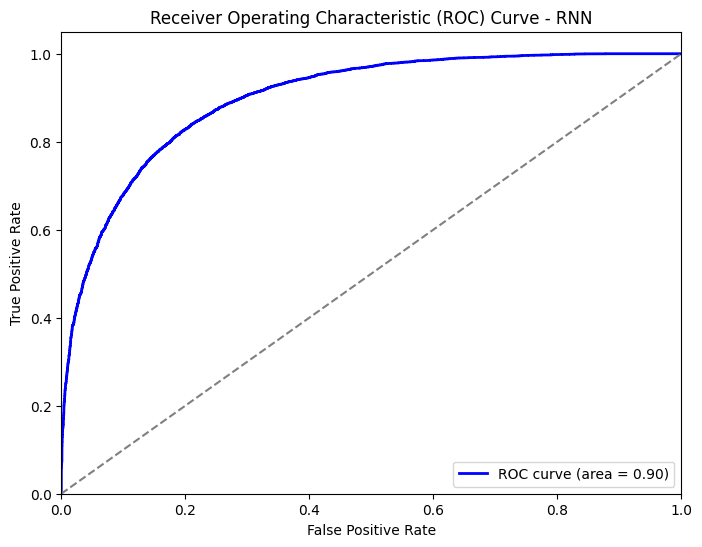

AUC del mejor modelo RNN: 0.8991


In [51]:
# Obtener predicciones del mejor modelo
best_model_pred_probs = best_model.predict(features_scaled.reshape(features_scaled.shape[0], 1, features_scaled.shape[1]))

# Obtener etiquetas reales en formato binario
label2_binary = to_categorical(label2)

# Calcular la curva ROC
fpr, tpr, _ = roc_curve(label2_binary[:, 1], best_model_pred_probs[:, 1])
roc_auc = auc(fpr, tpr)
roc_curves.append({'model': 'RNN', 'fpr': fpr, 'tpr': tpr, 'auc': roc_auc})


# Graficar la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Línea base
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - RNN')
plt.legend(loc='lower right')
plt.show()

# Imprimir el AUC
print(f'AUC del mejor modelo RNN: {roc_auc:.4f}')

# Ventanas Temporales

In [52]:
def create_sliding_window(features, labels, window_size, step_size):
    segments = []
    window_labels = []

    # Asegurarse de que las etiquetas son de la misma longitud que las características
    if len(features) != len(labels):
        raise ValueError("La longitud de las características y las etiquetas debe coincidir")

    # Crear segmentos usando la ventana deslizante
    for start_pos in range(0, len(features) - window_size + 1, step_size):
        end_pos = start_pos + window_size
        segment = features[start_pos:end_pos]
        segments.append(segment)

        # Aquí suponemos que el label de cada ventana es el label del último punto de datos en la ventana
        window_labels.append(labels[end_pos - 1])

    return np.array(segments), np.array(window_labels)

In [53]:
window_size = 1280  # Tamaño de la ventana temporal en puntos de datos
step_size = 1024    # Tamaño del paso entre ventanas

# Aplicar la ventana deslizante a tus datos
X, y = create_sliding_window(features_scaled, labels_encoded, window_size, step_size)

In [54]:
# Dividir los datos en entrenamiento y prueba (80% entrenamiento, 20% prueba)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Definir y compilar el modelo para clasificación binaria
model1 = Sequential([
    Input(shape=(X_train.shape[1], X_train.shape[2])),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.3),
    Dense(128, activation='relu'),
    Dropout(0.3),
    Dense(32, activation='relu'),
    Dense(2, activation='sigmoid')  # Capa final con 2 unidades para clasificación binaria
])

model1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', 'Recall'])

# Entrenar el modelo
model1.fit(X_train, y_train, epochs=50, batch_size=32, verbose=1)

# Evaluar el modelo
_, accuracy3, recall3 = model1.evaluate(X_test, y_test, verbose=0)
print("Accuracy:", accuracy3)
print("Recall:", recall3)

# Calcular el F1 Score
y_pred = model1.predict(X_test)
y_pred_binary = (y_pred > 0.5).astype(int)
f1_3 = f1_score(y_test.argmax(axis=1), y_pred_binary.argmax(axis=1))
print("F1 Score:", f1_3)

# Guardar el modelo
model1.save('models/modelo_ventanas_n.keras')

Epoch 1/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - Recall: 0.0000e+00 - accuracy: 0.3000 - loss: 1.1277
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - Recall: 0.4000 - accuracy: 0.9000 - loss: 4.3152
Epoch 3/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - Recall: 0.7000 - accuracy: 0.8000 - loss: 7.1282
Epoch 4/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - Recall: 0.9000 - accuracy: 1.0000 - loss: 0.9645
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step - Recall: 0.8000 - accuracy: 0.9000 - loss: 2.8492
Epoch 6/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step - Recall: 0.8000 - accuracy: 1.0000 - loss: 1.3756
Epoch 7/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step - Recall: 0.7000 - accuracy: 1.0000 - loss: 2.4396
Epoch 8/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - Recall: 1.0000 - accuracy: 1.0000 - loss: 0.0048
Epoch 9/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - Recall: 1.0000 - accuracy: 1.0000 - loss: 1.2628e-05
Epoch 10/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - Recall: 1.0000 - accuracy: 1.0000

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


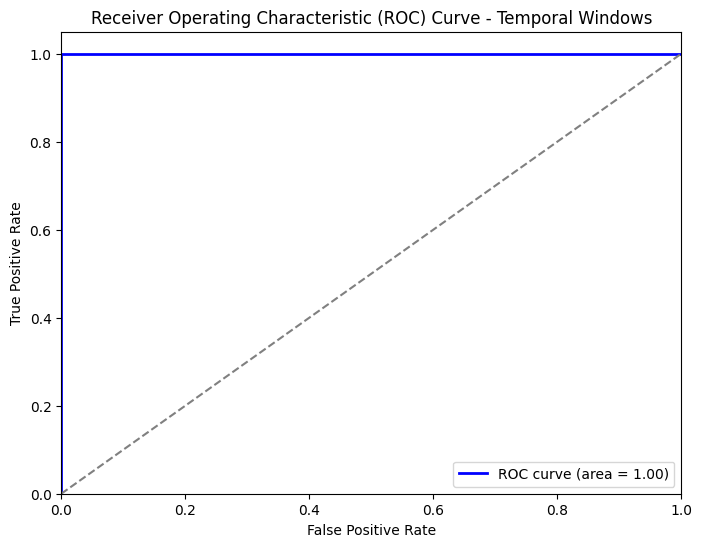

AUC del mejor modelo: 1.0000


In [68]:
# Obtener predicciones del mejor modelo
best_model_pred_probs = model1.predict(X_test)

# Obtener etiquetas reales en formato binario
label2_binary = y_test

# Calcular la curva ROC
fpr, tpr, _ = roc_curve(label2_binary[:, 1], best_model_pred_probs[:, 1])
roc_auc = auc(fpr, tpr)
roc_curves.append({'model': 'CNN TW', 'fpr': fpr, 'tpr': tpr, 'auc': roc_auc})


# Graficar la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Línea base
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - Temporal Windows')
plt.legend(loc='lower right')
plt.show()

# Imprimir el AUC
print(f'AUC del mejor modelo: {roc_auc:.4f}')

In [59]:
def evaluate_model(model, features, label, n_splits=5, model_name="Modelo"):
    """
    Evalúa un modelo utilizando validación cruzada estratificada y calcula métricas
    (accuracy, recall, F1 score). También genera la curva ROC y guarda la curva promedio.

    Parámetros:
        model: Modelo de clasificación de scikit-learn a evaluar.
        features: Matriz de características.
        label: Vector de etiquetas.
        n_splits: Número de divisiones para la validación cruzada.
        model_name: Nombre del modelo para almacenar en roc_curves.

    Retorna:
        Diccionario con los promedios de las métricas evaluadas.
    """
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    accuracies = []
    recalls = []
    f1_scores = []

    mean_fpr = np.linspace(0, 1, 100)  # Valores de FPR para la curva ROC promediada
    tprs = []  # Para almacenar los valores de TPR y promediar
    aucs = []  # Lista para guardar los AUC de cada fold

    plt.figure(figsize=(8, 6))  # Crear figura para la curva ROC

    for train_index, test_index in skf.split(features_scaled, label):
        X_train, X_test = features_scaled[train_index], features_scaled[test_index]
        y_train, y_test = label[train_index], label[test_index]

        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        y_prob = model.predict_proba(X_test)[:, 1]  # Obtener probabilidades de la clase positiva

        accuracies.append(accuracy_score(y_test, y_pred))
        recalls.append(recall_score(y_test, y_pred))
        f1_scores.append(f1_score(y_test, y_pred))

        # Calcular curva ROC
        fpr, tpr, _ = roc_curve(y_test, y_prob)
        aucs.append(auc(fpr, tpr))  # Calcular y almacenar AUC
        tprs.append(np.interp(mean_fpr, fpr, tpr))  # Interpolar valores de TPR

        plt.plot(fpr, tpr, alpha=0.3)  # Dibujar curvas ROC individuales

    # Promediar las curvas ROC
    mean_tpr = np.mean(tprs, axis=0)
    roc_auc = np.mean(aucs)  # Calcular AUC promedio
    plt.plot(mean_fpr, mean_tpr, color='blue', label=f'Curva ROC Promedio ({model_name}) = {roc_auc:.2f} ', lw=2)

    plt.plot([0, 1], [0, 1], linestyle='--', color='gray', alpha=0.7)  # Línea de referencia
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Curva ROC')
    plt.legend(loc='lower right')
    plt.show()

    # Guardar solo la curva ROC promedio del modelo en roc_curves
    roc_curves.append({'model': model_name, 'fpr': mean_fpr, 'tpr': mean_tpr, 'auc': roc_auc})

    metrics = {
        'Average Accuracy': np.mean(accuracies),
        'Average Recall': np.mean(recalls),
        'Average F1 Score': np.mean(f1_scores)
    }

    return metrics

In [60]:
# Crear modelos
logistic_model = LogisticRegression(max_iter=1000, solver='lbfgs')
rf_model = RandomForestClassifier()
gbm_model = GradientBoostingClassifier()
svm_model = SVC(probability=True)

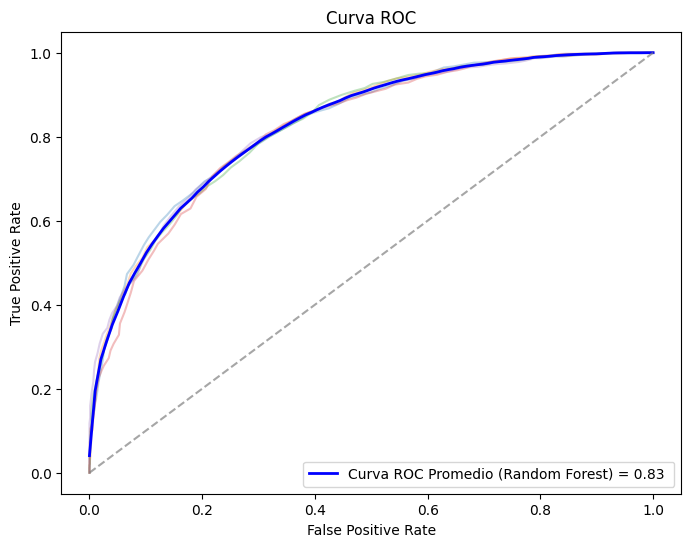

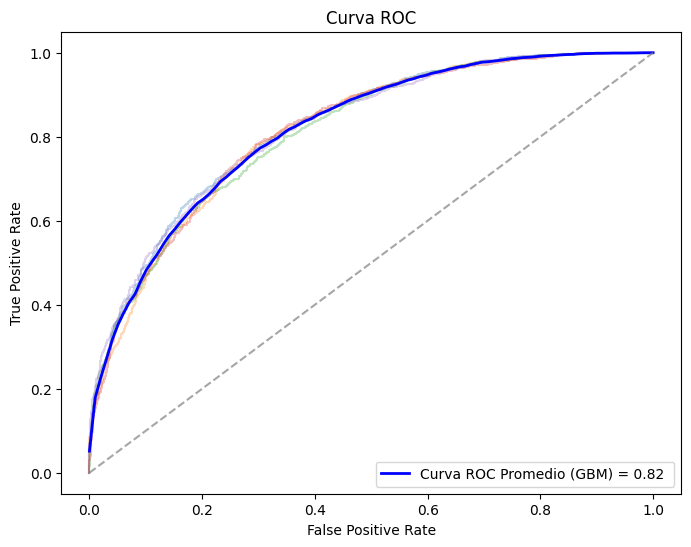

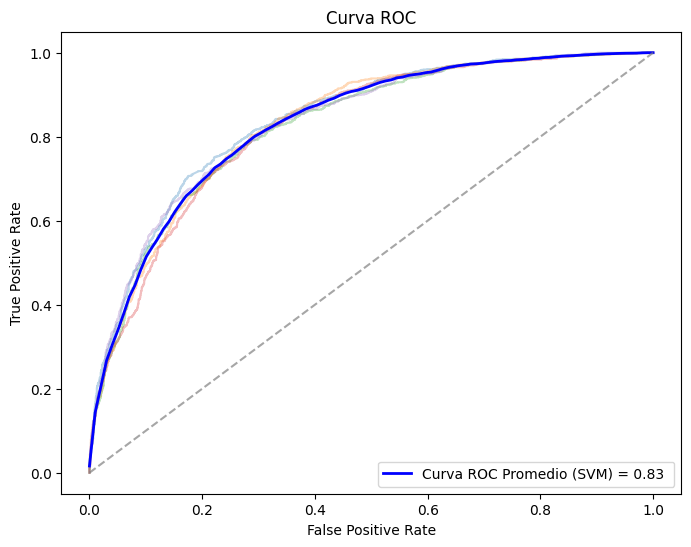

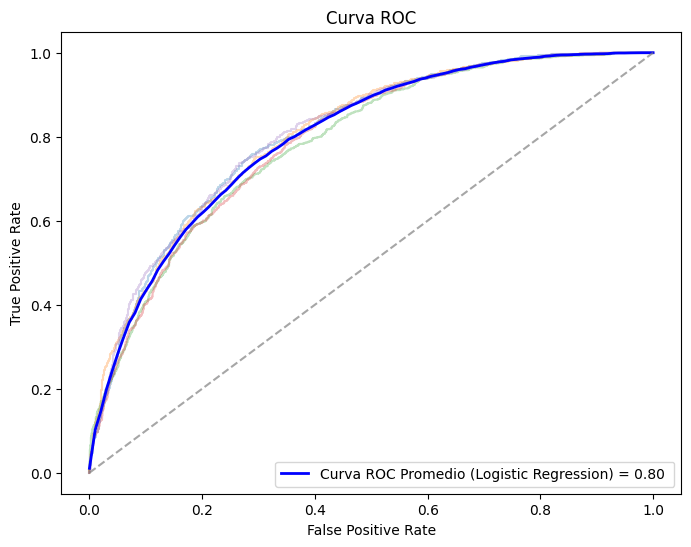

In [62]:
# Evaluar modelos
rf_metrics = evaluate_model(model=rf_model, features=features2, label=label2, model_name="Random Forest")
gbm_metrics = evaluate_model(model=gbm_model, features=features2, label=label2, model_name="GBM")
svm_metrics = evaluate_model(model=svm_model, features=features2, label=label2, model_name="SVM")
logistic_metrics = evaluate_model(model=logistic_model, features=features2, label=label2, model_name='Logistic Regression')

# Gráficas de resultados

In [63]:
models = ['Random Forest', 'Gradient Boosting', 'SVM', 'Logistic Regression', 'CNN', 'RNN', 'Temporal Windows']
accuracy = [rf_metrics['Average Accuracy'], gbm_metrics['Average Accuracy'], svm_metrics['Average Accuracy'], logistic_metrics['Average Accuracy'], best_accuracy1, best_accuracy2, accuracy3]
recall = [rf_metrics['Average Recall'], gbm_metrics['Average Recall'], svm_metrics['Average Recall'], logistic_metrics['Average Recall'], best_recall1, best_recall2, recall3]
f1_scores = [rf_metrics['Average F1 Score'], gbm_metrics['Average F1 Score'], svm_metrics['Average F1 Score'], logistic_metrics['Average F1 Score'], best_f1, best_f1_2, f1_3]

In [64]:
print(accuracy)
print(recall)
print(f1_scores)

[0.7477043158174129, 0.7354855045131883, 0.7554031535441948, 0.7203698659115083, 0.75, 0.7224576473236084, 0.6666666865348816]
[0.6595348806189142, 0.6561037748432706, 0.7172047485660931, 0.6815898359343737, 0.7510592937469482, 0.7245762944221497, 0.6666666865348816]
[0.6932648996866948, 0.6819698018912794, 0.7171579078568739, 0.6782120404308583, 0.6854082998661312, 0.6703020134228188, 0.6666666666666666]


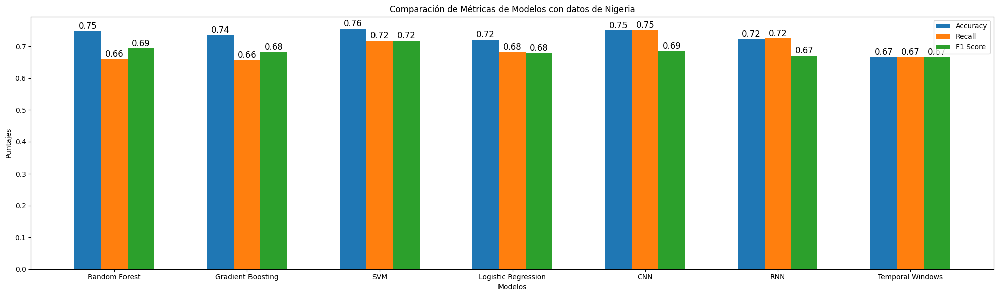

In [65]:
plt.figure(figsize=(20, 6))
x = np.arange(len(models)) 
width = 0.2

# Dibujar las barras para cada métrica
bars_accuracy = plt.bar(x - width, accuracy, width, label='Accuracy')
bars_recall = plt.bar(x, recall, width, label='Recall')
bars_f1 = plt.bar(x + width, f1_scores, width, label='F1 Score')

# Etiquetas y título
plt.xlabel('Modelos')
plt.ylabel('Puntajes')
plt.title('Comparación de Métricas de Modelos con datos de Nigeria')
plt.xticks(x, models)
plt.legend()

# Agregar los números en las barras
for i in range(len(models)):
    # Para cada barra, agregar el valor encima de la barra correspondiente
    plt.text(bars_accuracy[i].get_x() + bars_accuracy[i].get_width() / 2, 
             bars_accuracy[i].get_height() + 0.001, 
             f'{accuracy[i]:.2f}', 
             ha='center', va='bottom', fontsize=12)
    
    plt.text(bars_recall[i].get_x() + bars_recall[i].get_width() / 2, 
             bars_recall[i].get_height() + 0.001, 
             f'{recall[i]:.2f}', 
             ha='center', va='bottom', fontsize=12)
    
    plt.text(bars_f1[i].get_x() + bars_f1[i].get_width() / 2, 
             bars_f1[i].get_height() + 0.001, 
             f'{f1_scores[i]:.2f}', 
             ha='center', va='bottom', fontsize=12)

plt.tight_layout()
plt.show()

In [66]:
def plot_all_roc_curves(roc_curves):
    """
    Dibuja en una sola gráfica todas las curvas ROC almacenadas en la lista roc_curves.

    Parámetro:
        roc_curves: Lista de diccionarios con {'model': nombre, 'fpr': valores_fpr, 'tpr': valores_tpr, 'auc': valor_auc}.
    """
    plt.figure(figsize=(8, 6))

    for curve in roc_curves:
        plt.plot(curve['fpr'], curve['tpr'], label=f"{curve['model']} (AUC = {curve['auc']:.2f})")

    # Línea de referencia de una clasificación aleatoria
    plt.plot([0, 1], [0, 1], linestyle="--", color="gray", alpha=0.7)

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Curvas ROC Comparativas")
    plt.legend(loc="lower right")
    plt.show()


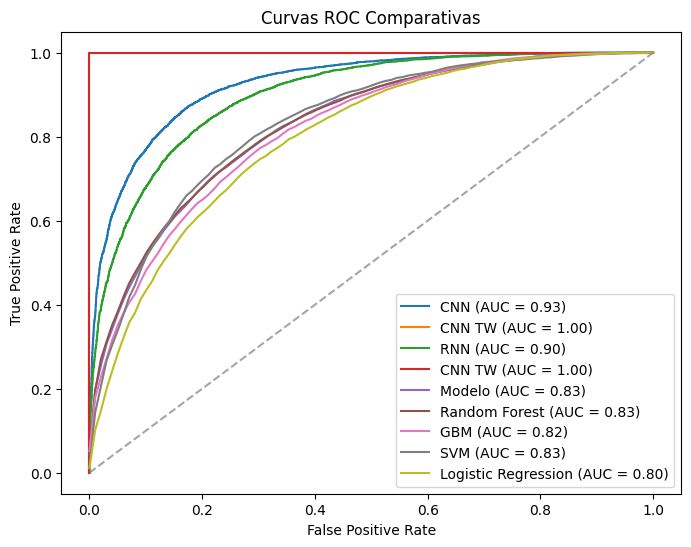

In [67]:
plot_all_roc_curves(roc_curves)
